# CG-Projection Enclosure with Projected Richardson Correction for the Updated Plate

This notebook applies the CG-projection enclosure with projected Richardson correction to the already-symmetrized system in `system_updated_plate`. It uses only `box_1.dat` and `box_2.dat`, symmetric Jacobi scaling, the legacy SciPy CG recurrence, and exactly $m=2200$ CG steps.

For each retained CG projection, the corrected center and enclosure map are

$$
\widehat x_m^{(j+1)}=\widehat x_m^{(j)}+\omega\Pi_m\left(b-A\widehat x_m^{(j)}\right),
\qquad
E_m^{(j+1)}=\Pi_m(I-\omega A)E_m^{(j)},
$$

with $E_m^{(0)}=\Pi_m$. The interval-hull radius is

$$
d_m^{\mathrm{proj}}=\left|E_m^{(q)}\right|d^0.
$$

The plate matrix has 21,570 coordinates, so dense $n$-by-$n$ enclosure maps are never materialized. Instead, columns of $(E_m^{(q)})^T$ are evaluated in memory-bounded blocks. The final enclosure covers every coordinate; checkpoint diagnostics use 80 evenly sampled coordinates. Both requested initial boxes are processed independently and without expansion.


In [1]:
from pathlib import Path
from time import perf_counter

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
from scipy.linalg import solve
from scipy.sparse import diags, load_npz
from scipy.sparse.linalg import eigsh
from scipy.sparse.linalg._isolve.utils import make_system

from system_updated_plate.cg_projection_enclosure import select_independent_directions


data_dir = Path("system_updated_plate")
A = load_npz(data_dir / "A.npz").tocsr()
b = np.loadtxt(data_dir / "b.dat", dtype=float)
x_star = np.loadtxt(data_dir / "soln_x.dat", dtype=float)

# This v5 experiment intentionally uses only boxes 1 and 2.
boxes = {
    "box_1": np.loadtxt(data_dir / "box_1.dat", dtype=float),
    "box_2": np.loadtxt(data_dir / "box_2.dat", dtype=float),
}

n = len(b)
if A.shape != (n, n):
    raise ValueError(f"Expected A to have shape {(n, n)}, got {A.shape}.")
if x_star.shape != (n,):
    raise ValueError(f"Expected x_star to have shape {(n,)}, got {x_star.shape}.")
if set(boxes) != {"box_1", "box_2"}:
    raise RuntimeError("This notebook must use only box_1 and box_2.")
for box_name, box in boxes.items():
    if box.shape != (n, 2):
        raise ValueError(f"{box_name} should have shape {(n, 2)}, got {box.shape}.")
    if np.any(box[:, 0] > box[:, 1]):
        raise ValueError(f"{box_name} has lower bounds above upper bounds.")
    if not np.all((box[:, 0] <= x_star) & (x_star <= box[:, 1])):
        raise ValueError(f"{box_name} does not contain the stored solution.")

solution_residual = np.linalg.norm(b - A @ x_star)
print(f"system dimension: {n}")
print(f"matrix nonzeros: {A.nnz}")
print(f"boxes: {', '.join(boxes)}")
print(f"stored solution residual: {solution_residual:.6e}")


system dimension: 21570
matrix nonzeros: 659988
boxes: box_1, box_2
stored solution residual: 4.866280e-11


## Jacobi scaling

With `scale = sqrt(diag(A))`, solve in the coordinates $y=\mathrm{scale}\,x$ and transform the reported enclosure coordinates back to the original variables.

The updated dataset already stores a verified solution of the symmetric system and two coordinate-varying, off-center boxes that contain it. Consequently, no coordinate-wise box expansion is applied here.


In [2]:
diagonal = A.diagonal()
if np.any(diagonal <= 0):
    raise ValueError("Jacobi scaling requires a positive diagonal.")

scale = np.sqrt(diagonal)
inverse_scale = 1.0 / scale
A_hat = (diags(inverse_scale) @ A @ diags(inverse_scale)).tocsr()
b_hat = inverse_scale * b

cg_projection_iterations = 2200
projected_richardson_steps = 10
diagnostic_period = 50
projection_qr_tolerance = 1e-10
projection_max_gram_condition = 1e12
enclosure_row_block_size = 128
max_tracked_coordinates = 80

if not 1 <= cg_projection_iterations <= n:
    raise ValueError("The algorithm requires 1 <= m <= n.")
if projected_richardson_steps < 0:
    raise ValueError("The number of projected Richardson steps must be nonnegative.")

lambda_min_hat = float(
    eigsh(A_hat, k=1, which="SA", return_eigenvectors=False, tol=1e-10)[0]
)
lambda_max_hat = float(
    eigsh(A_hat, k=1, which="LA", return_eigenvectors=False, tol=1e-10)[0]
)
omega = 2.0 / (lambda_min_hat + lambda_max_hat)
if not 0.0 < omega < 2.0 / lambda_max_hat:
    raise ValueError("omega must satisfy 0 < omega < 2 / lambda_max(A_hat).")

tracked_indices = np.unique(
    np.linspace(0, n - 1, min(n, max_tracked_coordinates)).round().astype(int)
)

print(f"tracked diagnostic coordinates: {len(tracked_indices)}")
print(f"fixed CG iterations m: {cg_projection_iterations}")
print(f"projected Richardson steps q: {projected_richardson_steps}")
print(f"lambda_max(A_hat): {lambda_max_hat:.8e}")
print(f"omega: {omega:.8e}")
print(f"2 / lambda_max(A_hat): {2.0 / lambda_max_hat:.8e}")
print(f"diagnostic period: {diagnostic_period}")


tracked diagnostic coordinates: 80
fixed CG iterations m: 2200
projected Richardson steps q: 10
lambda_max(A_hat): 4.15234237e+00
omega: 4.81655728e-01
2 / lambda_max(A_hat): 4.81655852e-01
diagnostic period: 50


## SciPy CG and projected Richardson enclosure

The CG loop below is the legacy unpreconditioned SciPy recurrence used by the earlier notebooks. It retains $p_k$ and $\widehat A p_k$ and omits only the tolerance exit, so the enclosure receives exactly $m=2200$ directions.

After selecting a stable linearly independent subset, the code forms $G_m=P_m^T\widehat A P_m$ and uses Gram solves for both $\widehat x_m^{(0)}$ and $\Pi_m$. Column normalization inside the selector is only an invariant basis change.

For scalability, a requested row of $E_m^{(q)}$ is obtained as a column of its transpose. Starting with the corresponding coordinate vector, the code applies

$$
(E_m^{(q)})^T=\Pi_m^T\bigl((I-\omega\widehat A)\Pi_m^T\bigr)^q,
$$

using $\Pi_m^T V=V-(\widehat A P_m)G_m^{-1}P_m^T V$. This evaluates $|E_m^{(q)}|d^0$ exactly up to floating-point arithmetic without storing a dense 21,570-by-21,570 matrix.


In [3]:
def scipy_cg_with_directions(A, b, x0, maxiter):
    """Run SciPy's legacy unpreconditioned CG recurrence and retain p_k and A p_k."""
    A, M, x, b, postprocess = make_system(A, None, x0, b)
    n = len(b)
    if not 1 <= maxiter <= n:
        raise ValueError(f"maxiter must satisfy 1 <= m <= n={n}.")

    dotprod = np.vdot if np.iscomplexobj(x) else np.dot
    matvec = A.matvec
    psolve = M.matvec
    residual = b - matvec(x) if x.any() else b.copy()

    directions = np.empty((n, maxiter), dtype=x.dtype)
    applied_directions = np.empty((n, maxiter), dtype=x.dtype)
    residual_norms = np.empty(maxiter, dtype=float)

    rho_previous, direction = None, None
    for iteration in range(maxiter):
        preconditioned_residual = psolve(residual)
        rho_current = dotprod(residual, preconditioned_residual)
        if iteration > 0:
            beta = rho_current / rho_previous
            direction *= beta
            direction += preconditioned_residual
        else:
            direction = np.empty_like(residual)
            direction[:] = preconditioned_residual[:]

        directions[:, iteration] = direction
        applied_direction = matvec(direction)
        applied_directions[:, iteration] = applied_direction
        alpha = rho_current / dotprod(direction, applied_direction)
        x += alpha * direction
        residual -= alpha * applied_direction
        rho_previous = rho_current
        residual_norms[iteration] = np.linalg.norm(residual)

    return {
        "x_cg": postprocess(x),
        "residual": residual,
        "residual_norms": residual_norms,
        "directions": directions,
        "applied_directions": applied_directions,
    }


def apply_projector(vector_or_matrix, selection):
    """Apply Pi_m without forming it."""
    basis = selection["basis"]
    applied_basis = selection["applied_basis"]
    gram = selection["gram"]
    coefficients = solve(
        gram,
        applied_basis.T @ vector_or_matrix,
        assume_a="sym",
        check_finite=False,
    )
    return vector_or_matrix - basis @ coefficients


def apply_projector_transpose(vector_or_matrix, selection):
    """Apply Pi_m.T without forming it."""
    basis = selection["basis"]
    applied_basis = selection["applied_basis"]
    gram = selection["gram"]
    coefficients = solve(
        gram,
        basis.T @ vector_or_matrix,
        assume_a="sym",
        check_finite=False,
    )
    return vector_or_matrix - applied_basis @ coefficients


def corrected_projected_center(A, b, center, selection, richardson_steps, omega):
    """Compute x_hat_m^(q)."""
    basis = selection["basis"]
    gram = selection["gram"]
    coefficients = solve(
        gram,
        basis.T @ (b - A @ center),
        assume_a="sym",
        check_finite=False,
    )
    corrected_center = center + basis @ coefficients
    for _ in range(richardson_steps):
        residual = b - A @ corrected_center
        corrected_center += omega * apply_projector(residual, selection)
    return corrected_center


def projected_richardson_enclosure_rows(
    A,
    b,
    lower,
    upper,
    selection,
    richardson_steps,
    omega,
    coordinate_indices=None,
    row_block_size=128,
    progress_label=None,
):
    """Evaluate the corrected enclosure on requested rows of E_m^(q)."""
    lower = np.asarray(lower, dtype=float)
    upper = np.asarray(upper, dtype=float)
    center = 0.5 * (lower + upper)
    initial_radius = 0.5 * (upper - lower)
    n = len(b)

    if coordinate_indices is None:
        coordinate_indices = np.arange(n, dtype=int)
    else:
        coordinate_indices = np.asarray(coordinate_indices, dtype=int)

    corrected_center = corrected_projected_center(
        A, b, center, selection, richardson_steps, omega
    )
    selected_count = len(coordinate_indices)
    projected_radius = np.empty(selected_count, dtype=float)
    contracted_lower = np.empty(selected_count, dtype=float)
    contracted_upper = np.empty(selected_count, dtype=float)

    started = perf_counter()
    report_stride = max(row_block_size, 2048)
    for start in range(0, selected_count, row_block_size):
        stop = min(selected_count, start + row_block_size)
        rows = coordinate_indices[start:stop]
        column_count = stop - start

        # Columns of (E_m^(q)).T corresponding to the requested output rows.
        transpose_columns = np.zeros((n, column_count), dtype=float)
        transpose_columns[rows, np.arange(column_count)] = 1.0
        transpose_columns = apply_projector_transpose(transpose_columns, selection)
        for _ in range(richardson_steps):
            transpose_columns = transpose_columns - omega * (A @ transpose_columns)
            transpose_columns = apply_projector_transpose(
                transpose_columns, selection
            )

        radius_block = np.abs(transpose_columns).T @ initial_radius
        projected_radius[start:stop] = radius_block
        contracted_lower[start:stop] = np.maximum(
            lower[rows], corrected_center[rows] - radius_block
        )
        contracted_upper[start:stop] = np.minimum(
            upper[rows], corrected_center[rows] + radius_block
        )

        if progress_label and (
            stop == selected_count or stop % report_stride < row_block_size
        ):
            print(
                f"{progress_label}: corrected enclosure rows {stop}/{selected_count} "
                f"({perf_counter() - started:.1f} s)"
            )

    if np.any(contracted_lower > contracted_upper):
        violation = contracted_lower - contracted_upper
        bad = np.flatnonzero(violation > 0.0)
        raise RuntimeError(
            "Projected Richardson enclosure produced inverted intervals; "
            f"maximum violation={np.max(violation):.6e}, "
            f"first local coordinates={bad[:10]}."
        )

    constraint_residual = selection["basis"].T @ (A @ corrected_center - b)
    return {
        "ell": contracted_lower,
        "u": contracted_upper,
        "x_hat": corrected_center[coordinate_indices],
        "radius": projected_radius,
        "coordinate_indices": coordinate_indices,
        "max_constraint_residual": float(
            np.max(np.abs(constraint_residual), initial=0.0)
        ),
    }


def run_projected_richardson_enclosure(
    A,
    b,
    lower,
    upper,
    iterations,
    richardson_steps,
    omega,
    tracked_indices,
    diagnostic_period=50,
    qr_tolerance=1e-10,
    max_gram_condition=1e12,
    row_block_size=128,
    progress_label=None,
):
    """Run the algorithm and retain sampled-row checkpoint diagnostics."""
    lower = np.asarray(lower, dtype=float)
    upper = np.asarray(upper, dtype=float)
    center = 0.5 * (lower + upper)
    tracked_indices = np.asarray(tracked_indices, dtype=int)

    cg_run = scipy_cg_with_directions(A, b, center, iterations)
    directions = cg_run["directions"]
    applied_directions = cg_run["applied_directions"]
    checkpoints = np.arange(
        diagnostic_period, iterations + 1, diagnostic_period, dtype=int
    )
    if checkpoints.size == 0 or checkpoints[-1] != iterations:
        checkpoints = np.append(checkpoints, iterations)

    tracked_lower_history = [lower[tracked_indices].copy()]
    tracked_upper_history = [upper[tracked_indices].copy()]
    tracked_center_history = [center[tracked_indices].copy()]
    tracked_radius_history = [
        0.5 * (upper[tracked_indices] - lower[tracked_indices])
    ]
    diagnostics = []
    final_selection = None

    for checkpoint in checkpoints:
        selection = select_independent_directions(
            directions=directions[:, :checkpoint],
            applied_directions=applied_directions[:, :checkpoint],
            qr_tolerance=qr_tolerance,
            max_gram_condition=max_gram_condition,
        )
        tracked = projected_richardson_enclosure_rows(
            A=A,
            b=b,
            lower=lower,
            upper=upper,
            selection=selection,
            richardson_steps=richardson_steps,
            omega=omega,
            coordinate_indices=tracked_indices,
            row_block_size=row_block_size,
        )
        tracked_lower_history.append(tracked["ell"])
        tracked_upper_history.append(tracked["u"])
        tracked_center_history.append(tracked["x_hat"])
        tracked_radius_history.append(tracked["radius"])
        diagnostics.append({
            "iteration": int(checkpoint),
            "available_direction_count": selection["available_direction_count"],
            "valid_direction_count": selection["valid_direction_count"],
            "qr_rank": selection["qr_rank"],
            "retained_rank": selection["retained_rank"],
            "gram_condition": selection["gram_condition"],
            "gram_identity_fro": selection["gram_identity_fro"],
            "gram_max_offdiag": selection["gram_max_offdiag"],
            "gram_symmetry_error": selection["gram_symmetry_error"],
            "gram_diag_max_error": selection["gram_diag_max_error"],
            "max_constraint_residual": tracked["max_constraint_residual"],
        })
        if checkpoint == iterations:
            final_selection = selection

    full_enclosure = projected_richardson_enclosure_rows(
        A=A,
        b=b,
        lower=lower,
        upper=upper,
        selection=final_selection,
        richardson_steps=richardson_steps,
        omega=omega,
        coordinate_indices=None,
        row_block_size=row_block_size,
        progress_label=progress_label,
    )

    return {
        "ell": full_enclosure["ell"],
        "u": full_enclosure["u"],
        "x_hat": full_enclosure["x_hat"],
        "radius": full_enclosure["radius"],
        "iterations": np.r_[0, checkpoints],
        "ell_history": np.asarray(tracked_lower_history),
        "u_history": np.asarray(tracked_upper_history),
        "projected_center_history": np.asarray(tracked_center_history),
        "projected_radius_history": np.asarray(tracked_radius_history),
        "diagnostics": diagnostics,
        "residual_norms": cg_run["residual_norms"],
        "x_cg": cg_run["x_cg"],
        "qr_rank": final_selection["qr_rank"],
        "retained_rank": final_selection["retained_rank"],
        "gram_condition": final_selection["gram_condition"],
        "max_constraint_residual": full_enclosure["max_constraint_residual"],
    }


## Run the enclosure

box_1: corrected enclosure rows 2048/21570 (141.5 s)
box_1: corrected enclosure rows 4096/21570 (282.9 s)
box_1: corrected enclosure rows 6144/21570 (425.0 s)
box_1: corrected enclosure rows 8192/21570 (569.6 s)
box_1: corrected enclosure rows 10240/21570 (711.1 s)
box_1: corrected enclosure rows 12288/21570 (854.6 s)
box_1: corrected enclosure rows 14336/21570 (996.4 s)
box_1: corrected enclosure rows 16384/21570 (1136.9 s)
box_1: corrected enclosure rows 18432/21570 (1276.5 s)
box_1: corrected enclosure rows 20480/21570 (1417.4 s)
box_1: corrected enclosure rows 21570/21570 (1496.1 s)
box_1 fixed SciPy-CG iterations: 2200
box_1 projected Richardson steps: 10
box_1 CG residual after m steps: 2.641259e-13
box_1 final QR rank: 1940
box_1 final retained rank: 1937
box_1 final cond(G): 3.616979e+08
box_1 max projected-center constraint residual: 1.100777e-12
box_1 final mean full-box shrinkage: 0.000000%
box_1 full coordinates tightened: 0 / 21570
box_1 final projected-radius ratio (min/m

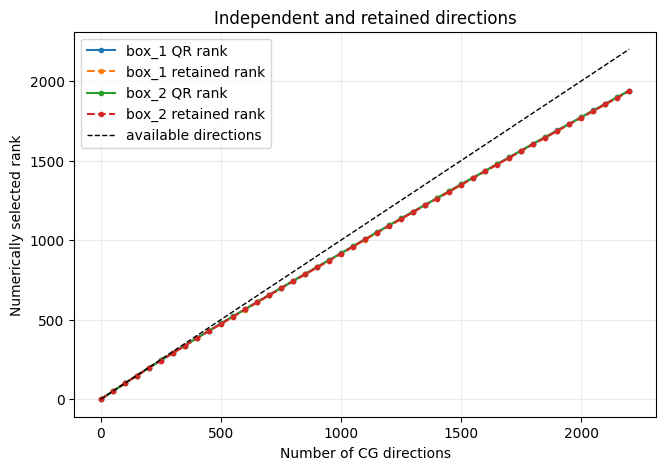

In [4]:
box_results = {}

for box_name, box in boxes.items():
    ell_hat = scale * box[:, 0]
    u_hat = scale * box[:, 1]

    result = run_projected_richardson_enclosure(
        A=A_hat,
        b=b_hat,
        lower=ell_hat,
        upper=u_hat,
        iterations=cg_projection_iterations,
        richardson_steps=projected_richardson_steps,
        omega=omega,
        tracked_indices=tracked_indices,
        diagnostic_period=diagnostic_period,
        qr_tolerance=projection_qr_tolerance,
        max_gram_condition=projection_max_gram_condition,
        row_block_size=enclosure_row_block_size,
        progress_label=box_name,
    )

    result["box_name"] = box_name
    result["ell_x"] = result["ell"] / scale
    result["u_x"] = result["u"] / scale
    result["x_hat_x"] = result["x_hat"] / scale
    result["radius_x"] = result["radius"] / scale
    result["ell_history_x"] = result["ell_history"] / scale[tracked_indices][None, :]
    result["u_history_x"] = result["u_history"] / scale[tracked_indices][None, :]
    result["projected_center_history_x"] = (
        result["projected_center_history"] / scale[tracked_indices][None, :]
    )
    result["projected_radius_history_x"] = (
        result["projected_radius_history"] / scale[tracked_indices][None, :]
    )
    initial_center = np.mean(box[tracked_indices], axis=1)
    initial_width = box[tracked_indices, 1] - box[tracked_indices, 0]
    initial_radius = 0.5 * initial_width
    width_history = result["u_history_x"] - result["ell_history_x"]
    with np.errstate(divide="ignore", invalid="ignore"):
        result["shrinkage_history"] = np.clip(
            100.0 * (1.0 - width_history / initial_width[None, :]),
            0.0,
            100.0,
        )
        result["projected_radius_ratio_history"] = (
            result["projected_radius_history_x"] / initial_radius[None, :]
        )
        result["center_shift_ratio_history"] = (
            np.abs(result["projected_center_history_x"] - initial_center[None, :])
            / initial_radius[None, :]
        )
        result["coverage_margin_ratio_history"] = (
            result["projected_radius_ratio_history"]
            - result["center_shift_ratio_history"]
        )

    final_ell = result["ell_x"]
    final_u = result["u_x"]
    result["full_contains_solution"] = bool(
        np.all((final_ell <= x_star) & (x_star <= final_u))
    )
    result["tracked_contains_solution"] = bool(
        np.all(
            (result["ell_history_x"][-1] <= x_star[tracked_indices])
            & (x_star[tracked_indices] <= result["u_history_x"][-1])
        )
    )
    result["qr_rank_history"] = np.r_[
        0, [diagnostic["qr_rank"] for diagnostic in result["diagnostics"]]
    ]
    result["retained_rank_history"] = np.r_[
        0, [diagnostic["retained_rank"] for diagnostic in result["diagnostics"]]
    ]
    result["gram_condition_history"] = np.r_[
        1.0, [diagnostic["gram_condition"] for diagnostic in result["diagnostics"]]
    ]
    result["gram_identity_fro_history"] = np.r_[
        0.0, [diagnostic["gram_identity_fro"] for diagnostic in result["diagnostics"]]
    ]
    result["gram_max_offdiag_history"] = np.r_[
        0.0, [diagnostic["gram_max_offdiag"] for diagnostic in result["diagnostics"]]
    ]
    box_results[box_name] = result

    full_initial_width = box[:, 1] - box[:, 0]
    full_final_width = result["u_x"] - result["ell_x"]
    full_shrinkage = np.clip(
        100.0 * (1.0 - full_final_width / full_initial_width), 0.0, 100.0
    )
    print(f"{box_name} fixed SciPy-CG iterations: {len(result['residual_norms'])}")
    print(f"{box_name} projected Richardson steps: {projected_richardson_steps}")
    print(f"{box_name} CG residual after m steps: {result['residual_norms'][-1]:.6e}")
    print(f"{box_name} final QR rank: {result['qr_rank']}")
    print(f"{box_name} final retained rank: {result['retained_rank']}")
    print(f"{box_name} final cond(G): {result['gram_condition']:.6e}")
    print(f"{box_name} max projected-center constraint residual: {result['max_constraint_residual']:.6e}")
    print(
        f"{box_name} final mean full-box shrinkage: "
        f"{np.nanmean(full_shrinkage):.6f}%"
    )
    print(
        f"{box_name} full coordinates tightened: "
        f"{np.count_nonzero(full_shrinkage > 1e-10)} / {n}"
    )
    print(
        f"{box_name} final projected-radius ratio (min/median/max): "
        f"{np.min(result['projected_radius_ratio_history'][-1]):.3e} / "
        f"{np.median(result['projected_radius_ratio_history'][-1]):.3e} / "
        f"{np.max(result['projected_radius_ratio_history'][-1]):.3e}"
    )
    print(
        f"{box_name} raw projected intervals containing the original interval: "
        f"{np.count_nonzero(result['coverage_margin_ratio_history'][-1] >= 1.0)} / "
        f"{len(tracked_indices)}"
    )
    print(
        f"{box_name} final full enclosure contains the stored solution: "
        f"{result['full_contains_solution']}"
    )

max_direction_count = max(result["iterations"][-1] for result in box_results.values())
fig, ax = plt.subplots(figsize=(7.5, 5))
for box_name, result in box_results.items():
    ax.plot(
        result["iterations"],
        result["qr_rank_history"],
        marker="o",
        markersize=3,
        label=f"{box_name} QR rank",
    )
    ax.plot(
        result["iterations"],
        result["retained_rank_history"],
        marker="o",
        markersize=3,
        linestyle="--",
        label=f"{box_name} retained rank",
    )
ax.plot(
    [0, max_direction_count],
    [0, max_direction_count],
    color="black",
    linestyle="--",
    linewidth=1,
    label="available directions",
)
ax.set_xlabel("Number of CG directions")
ax.set_ylabel("Numerically selected rank")
ax.set_title("Independent and retained directions")
ax.grid(alpha=0.25)
ax.legend()
plt.show()


## Contraction diagnostics

These plots follow the performance-analysis ideas in the non-simplified `system_303_solver_v3.ipynb`: total width, incremental width reduction, fraction of coordinates tightened, coordinate-wise final bounds, Gram conditioning, and loss of $A$-conjugacy. The final enclosure is computed for every coordinate. Checkpoint histories use 80 evenly sampled rows to avoid repeating the expensive full-projector hull calculation at every diagnostic iteration.

The additional projected-radius diagnostic isolates the main obstruction. For an original interval with center $c_0$ and radius $d_0$, the raw corrected interval contains the entire original interval whenever

$$
\frac{d_m^{\mathrm{proj}}-|x_m-c_0|}{d_0} \ge 1.
$$

In that case, intersecting the two intervals cannot contract that coordinate.

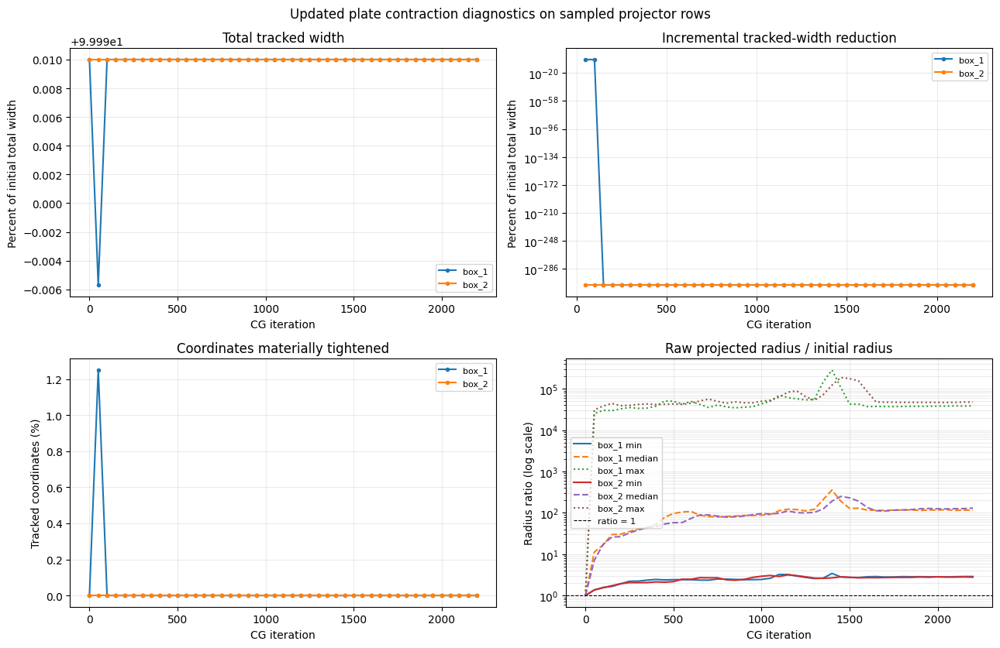

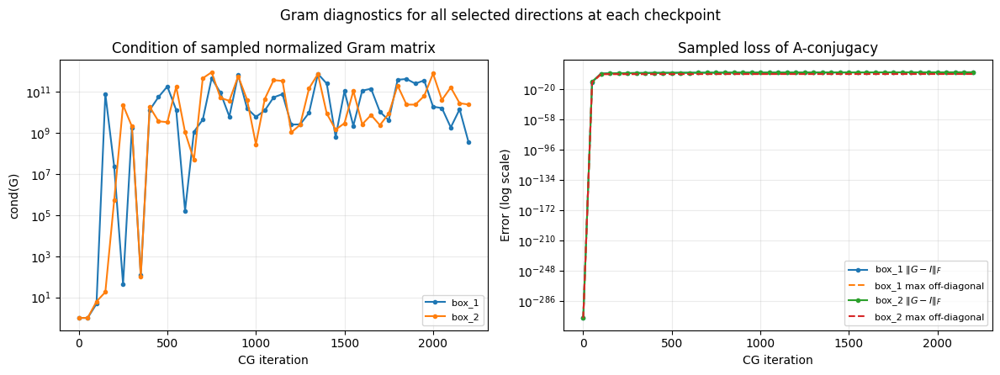

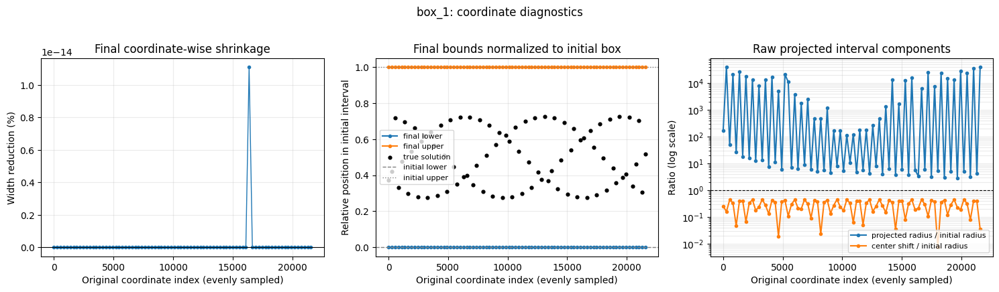

box_1 final diagnostic summary
  materially contracted coordinates: 0 / 80
  raw projected interval contains original: 80 / 80
  coverage-margin ratio min/median/max: 2.529e+00 / 1.163e+02 / 3.880e+04
  final cond(G): 3.617e+08
  final ||G-I||_F: 4.564e+01
  final max off-diagonal: 3.102e-01
  diagnosis: every sampled raw projected interval contains its original interval, so intersection cannot contract it.


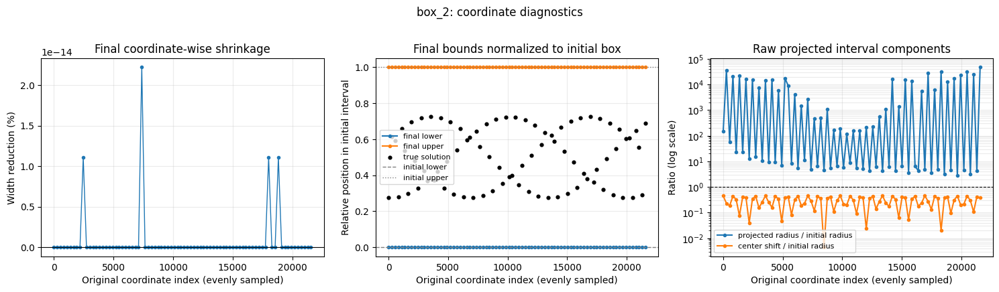

box_2 final diagnostic summary
  materially contracted coordinates: 0 / 80
  raw projected interval contains original: 80 / 80
  coverage-margin ratio min/median/max: 2.326e+00 / 1.299e+02 / 4.761e+04
  final cond(G): 2.389e+10
  final ||G-I||_F: 4.632e+01
  final max off-diagonal: 2.993e-01
  diagnosis: every sampled raw projected interval contains its original interval, so intersection cannot contract it.


In [5]:
diagnostic_series = {}

for box_name, result in box_results.items():
    box = boxes[box_name][tracked_indices]
    initial_width = box[:, 1] - box[:, 0]
    width_history = result["u_history_x"] - result["ell_history_x"]
    total_width = np.sum(width_history, axis=1)
    total_width_reduction = np.r_[0.0, total_width[:-1] - total_width[1:]]
    width_tolerance = 100.0 * np.finfo(float).eps * max(1.0, float(np.max(initial_width)))
    contracted_fraction = np.mean(
        width_history < initial_width[None, :] - width_tolerance,
        axis=1,
    )
    diagnostic_series[box_name] = {
        "total_width": total_width,
        "total_width_pct": 100.0 * total_width / total_width[0],
        "incremental_reduction_pct": 100.0 * total_width_reduction / total_width[0],
        "contracted_fraction_pct": 100.0 * contracted_fraction,
    }

fig, axes = plt.subplots(2, 2, figsize=(13, 8.5))
for box_name, result in box_results.items():
    iterations = result["iterations"]
    series = diagnostic_series[box_name]
    axes[0, 0].plot(iterations, series["total_width_pct"], marker="o", markersize=3, label=box_name)
    axes[0, 1].semilogy(
        iterations[1:],
        np.maximum(np.abs(series["incremental_reduction_pct"][1:]), np.finfo(float).tiny),
        marker="o",
        markersize=3,
        label=box_name,
    )
    axes[1, 0].plot(iterations, series["contracted_fraction_pct"], marker="o", markersize=3, label=box_name)

    radius_ratio = result["projected_radius_ratio_history"]
    axes[1, 1].semilogy(iterations, np.min(radius_ratio, axis=1), label=f"{box_name} min")
    axes[1, 1].semilogy(iterations, np.median(radius_ratio, axis=1), linestyle="--", label=f"{box_name} median")
    axes[1, 1].semilogy(iterations, np.max(radius_ratio, axis=1), linestyle=":", label=f"{box_name} max")

axes[0, 0].set(title="Total tracked width", ylabel="Percent of initial total width")
axes[0, 1].set(title="Incremental tracked-width reduction", ylabel="Percent of initial total width")
axes[1, 0].set(title="Coordinates materially tightened", ylabel="Tracked coordinates (%)")
axes[1, 1].set(title="Raw projected radius / initial radius", ylabel="Radius ratio (log scale)")
axes[1, 1].axhline(1.0, color="black", linewidth=0.8, linestyle="--", label="ratio = 1")
for ax in axes.flat:
    ax.set_xlabel("CG iteration")
    ax.grid(alpha=0.25, which="both")
    ax.legend(fontsize=8)
fig.suptitle("Updated plate contraction diagnostics on sampled projector rows")
fig.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
for box_name, result in box_results.items():
    iterations = result["iterations"]
    axes[0].semilogy(
        iterations,
        result["gram_condition_history"],
        marker="o",
        markersize=3,
        label=box_name,
    )
    axes[1].semilogy(
        iterations,
        np.maximum(result["gram_identity_fro_history"], np.finfo(float).tiny),
        marker="o",
        markersize=3,
        label=f"{box_name} $\\|G-I\\|_F$",
    )
    axes[1].semilogy(
        iterations,
        np.maximum(result["gram_max_offdiag_history"], np.finfo(float).tiny),
        linestyle="--",
        label=f"{box_name} max off-diagonal",
    )
axes[0].set(title="Condition of sampled normalized Gram matrix", ylabel="cond(G)")
axes[1].set(title="Sampled loss of A-conjugacy", ylabel="Error (log scale)")
for ax in axes:
    ax.set_xlabel("CG iteration")
    ax.grid(alpha=0.25, which="both")
    ax.legend(fontsize=8)
fig.suptitle("Gram diagnostics for all selected directions at each checkpoint")
fig.tight_layout()
plt.show()

for box_name, result in box_results.items():
    box = boxes[box_name][tracked_indices]
    initial_lower = box[:, 0]
    initial_width = box[:, 1] - box[:, 0]
    final_lower = result["ell_history_x"][-1]
    final_upper = result["u_history_x"][-1]
    final_shrinkage = result["shrinkage_history"][-1]
    normalized_solution = (x_star[tracked_indices] - initial_lower) / initial_width
    normalized_final_lower = (final_lower - initial_lower) / initial_width
    normalized_final_upper = (final_upper - initial_lower) / initial_width
    final_radius_ratio = result["projected_radius_ratio_history"][-1]
    final_center_shift_ratio = result["center_shift_ratio_history"][-1]
    final_coverage_margin = result["coverage_margin_ratio_history"][-1]

    fig, axes = plt.subplots(1, 3, figsize=(15, 4.4))
    axes[0].plot(tracked_indices, final_shrinkage, marker="o", markersize=3, linewidth=1)
    axes[0].axhline(0, color="black", linewidth=0.8)
    axes[0].set(title="Final coordinate-wise shrinkage", ylabel="Width reduction (%)")

    axes[1].plot(tracked_indices, normalized_final_lower, marker="o", markersize=3, label="final lower")
    axes[1].plot(tracked_indices, normalized_final_upper, marker="o", markersize=3, label="final upper")
    axes[1].scatter(tracked_indices, normalized_solution, s=12, color="black", label="true solution", zorder=3)
    axes[1].axhline(0, color="0.5", linestyle="--", linewidth=1, label="initial lower")
    axes[1].axhline(1, color="0.5", linestyle=":", linewidth=1, label="initial upper")
    axes[1].set(title="Final bounds normalized to initial box", ylabel="Relative position in initial interval")
    axes[1].legend(fontsize=8)

    axes[2].semilogy(tracked_indices, final_radius_ratio, marker="o", markersize=3, label="projected radius / initial radius")
    axes[2].semilogy(tracked_indices, np.maximum(final_center_shift_ratio, np.finfo(float).tiny), marker="o", markersize=3, label="center shift / initial radius")
    axes[2].axhline(1, color="black", linewidth=0.8, linestyle="--")
    axes[2].set(title="Raw projected interval components", ylabel="Ratio (log scale)")
    axes[2].legend(fontsize=8)

    for ax in axes:
        ax.set_xlabel("Original coordinate index (evenly sampled)")
        ax.grid(alpha=0.25, which="both")
    fig.suptitle(f"{box_name}: coordinate diagnostics")
    fig.tight_layout()
    plt.show()

    materially_contracted = final_shrinkage > 1e-10
    raw_contains_original = final_coverage_margin >= 1.0
    print(f"{box_name} final diagnostic summary")
    print(f"  materially contracted coordinates: {np.count_nonzero(materially_contracted)} / {len(tracked_indices)}")
    print(f"  raw projected interval contains original: {np.count_nonzero(raw_contains_original)} / {len(tracked_indices)}")
    print(f"  coverage-margin ratio min/median/max: {np.min(final_coverage_margin):.3e} / {np.median(final_coverage_margin):.3e} / {np.max(final_coverage_margin):.3e}")
    print(f"  final cond(G): {result['gram_condition_history'][-1]:.3e}")
    print(f"  final ||G-I||_F: {result['gram_identity_fro_history'][-1]:.3e}")
    print(f"  final max off-diagonal: {result['gram_max_offdiag_history'][-1]:.3e}")
    if np.all(raw_contains_original):
        print("  diagnosis: every sampled raw projected interval contains its original interval, so intersection cannot contract it.")
    elif not np.any(materially_contracted):
        print("  diagnosis: no sampled coordinate contracts, although some raw projected intervals do not fully contain the originals; inspect the normalized-bound plot.")
    else:
        print("  diagnosis: contraction occurs on a subset of sampled coordinates; inspect the fraction and coordinate-wise plots.")


## Legacy SciPy CG residuals

For each requested initial box, the retained-direction loop uses the legacy SciPy CG recurrence on the scaled system for exactly $m=2200$ steps. The plotted residual is $\lVert \widehat b-\widehat A y_k\rVert_2$.


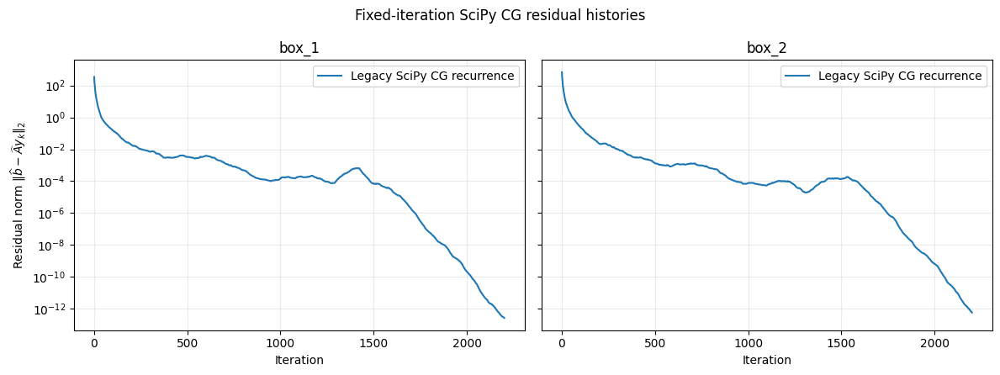

In [6]:
fig, axes = plt.subplots(1, len(box_results), figsize=(12, 4.5), sharey=True)
axes = np.atleast_1d(axes)
for ax, (box_name, result) in zip(axes, box_results.items()):
    residuals = result["residual_norms"]
    ax.semilogy(
        np.arange(1, len(residuals) + 1),
        residuals,
        label="Legacy SciPy CG recurrence",
    )
    ax.set_xlabel("Iteration")
    ax.set_title(box_name)
    ax.grid(alpha=0.25, which="both")
    ax.legend()

axes[0].set_ylabel(r"Residual norm $\|\widehat b-\widehat A y_k\|_2$")
fig.suptitle("Fixed-iteration SciPy CG residual histories")
fig.tight_layout()
plt.show()


## Controllable animation

The animation shows coordinate-wise contraction from the projected Richardson enclosure. Because the plate system is large, the horizontal axis contains 80 evenly sampled original coordinate indices. The frame slider advances through the diagnostic checkpoints and includes the fixed final iteration $m=2200$.


In [7]:
def display_coordinate_contraction_animation(results, indices, title):
    frame_iterations = np.unique(
        np.concatenate([result["iterations"] for result in results.values()])
    )

    finite_values = np.concatenate([
        result["shrinkage_history"][np.isfinite(result["shrinkage_history"])]
        for result in results.values()
    ])
    y_max = max(1.0, float(np.max(finite_values)) * 1.05) if finite_values.size else 1.0

    fig, ax = plt.subplots(figsize=(9, 4.5))
    lines = {}
    for box_name, result in results.items():
        line, = ax.plot(
            indices,
            np.nan_to_num(result["shrinkage_history"][0]),
            marker="o",
            markersize=3,
            linewidth=1,
            label=box_name,
        )
        lines[box_name] = line

    label = ax.text(0.02, 0.95, "", transform=ax.transAxes, va="top")
    ax.axhline(0, color="black", linewidth=0.8)
    ax.set(xlim=(indices[0], indices[-1]), ylim=(0, y_max))
    ax.set_xlabel("Original coordinate index (evenly sampled)")
    ax.set_ylabel("Width reduction (% of original width)")
    ax.set_title(title)
    ax.grid(alpha=0.25)
    ax.legend()

    def update(frame):
        direction_count = frame_iterations[frame]
        artists = []
        for box_name, result in results.items():
            history_index = np.searchsorted(
                result["iterations"], direction_count, side="right"
            ) - 1
            lines[box_name].set_ydata(
                np.nan_to_num(result["shrinkage_history"][history_index])
            )
            artists.append(lines[box_name])
        label.set_text(f"CG directions {direction_count}")
        return (*artists, label)

    animation = FuncAnimation(
        fig,
        update,
        frames=len(frame_iterations),
        interval=180,
        repeat_delay=1000,
    )
    display(HTML(animation.to_jshtml(fps=5, default_mode="loop")))
    plt.close(fig)
    return animation


### Coordinate contraction

In [8]:
coordinate_contraction_animation = display_coordinate_contraction_animation(
    box_results,
    tracked_indices,
    "Updated plate projected-Richardson coordinate contraction",
)


## Corrected projected bounds before intersection

This animation shows the raw corrected bounds $\widehat x_m^{(q)}-d_m^{\mathrm{proj}}$ and $\widehat x_m^{(q)}+d_m^{\mathrm{proj}}$ before intersection with the initial box. The initial lower and upper bounds are retained as hollow reference circles. The animation uses the 80 evenly sampled diagnostic coordinates.


In [9]:
def display_preintersection_bound_animation(results, initial_boxes, indices, title):
    indices = np.asarray(indices, dtype=int)
    if indices.size == 0:
        raise ValueError("indices must not be empty.")

    frame_iterations = np.unique(np.concatenate([
        result["iterations"][1:] for result in results.values()
    ]))
    box_names = list(results)
    fig, axes = plt.subplots(
        1, len(box_names), figsize=(7 * len(box_names), 5),
        sharex=True, squeeze=False, constrained_layout=True,
    )
    axes = axes.ravel()
    fig.suptitle(title)
    iteration_label = axes[0].text(
        0.02, 0.96, "", transform=axes[0].transAxes, va="top"
    )
    artists = {}

    for ax, box_name in zip(axes, box_names):
        result = results[box_name]
        initial_lower = initial_boxes[box_name][indices, 0]
        initial_upper = initial_boxes[box_name][indices, 1]
        raw_lower = (
            result["projected_center_history_x"]
            - result["projected_radius_history_x"]
        )
        raw_upper = (
            result["projected_center_history_x"]
            + result["projected_radius_history_x"]
        )

        # Hollow circles are the fixed initial-box references.
        ax.scatter(
            indices, initial_lower, s=14, facecolors="none",
            edgecolors="tab:blue", linewidths=0.8, alpha=0.7,
            label="initial lower",
        )
        ax.scatter(
            indices, initial_upper, s=14, facecolors="none",
            edgecolors="tab:orange", linewidths=0.8, alpha=0.7,
            label="initial upper",
        )
        raw_lower_line, = ax.plot(
            indices, raw_lower[1], color="tab:blue", marker="o",
            markersize=3.5, linewidth=0.8, label="raw projected lower",
        )
        raw_upper_line, = ax.plot(
            indices, raw_upper[1], color="tab:orange", marker="o",
            markersize=3.5, linewidth=0.8, label="raw projected upper",
        )

        finite_values = np.concatenate([
            initial_lower[np.isfinite(initial_lower)],
            initial_upper[np.isfinite(initial_upper)],
            raw_lower[1:][np.isfinite(raw_lower[1:])],
            raw_upper[1:][np.isfinite(raw_upper[1:])],
        ])
        if finite_values.size:
            y_min = float(np.min(finite_values))
            y_max = float(np.max(finite_values))
            padding = 0.05 * max(y_max - y_min, abs(y_min), abs(y_max), 1.0)
            ax.set_ylim(y_min - padding, y_max + padding)

        if indices.size == 1:
            ax.set_xlim(indices[0] - 0.5, indices[0] + 0.5)
        else:
            ax.set_xlim(indices[0], indices[-1])
        ax.set_title(box_name)
        ax.set_xlabel("Original coordinate index (evenly sampled)")
        ax.set_ylabel("Bound value")
        ax.grid(alpha=0.25)
        ax.legend(fontsize=8, ncol=2)
        artists[box_name] = {
            "lower_line": raw_lower_line,
            "upper_line": raw_upper_line,
            "raw_lower": raw_lower,
            "raw_upper": raw_upper,
        }

    def update(frame):
        direction_count = frame_iterations[frame]
        changed = []
        for box_name, result in results.items():
            history_index = np.searchsorted(
                result["iterations"], direction_count, side="right"
            ) - 1
            box_artists = artists[box_name]
            box_artists["lower_line"].set_ydata(
                box_artists["raw_lower"][history_index]
            )
            box_artists["upper_line"].set_ydata(
                box_artists["raw_upper"][history_index]
            )
            changed.extend([
                box_artists["lower_line"], box_artists["upper_line"]
            ])
        iteration_label.set_text(f"CG directions {int(direction_count)}")
        return (*changed, iteration_label)

    update(0)
    animation = FuncAnimation(
        fig, update, frames=len(frame_iterations), interval=300,
        blit=False, repeat_delay=1000,
    )
    display(HTML(animation.to_jshtml(fps=4, default_mode="loop")))
    plt.close(fig)
    return animation


preintersection_bound_animation = display_preintersection_bound_animation(
    box_results,
    boxes,
    tracked_indices,
    "Updated plate corrected bounds before initial-box intersection",
)
